In [2]:
%load_ext autoreload
%autoreload 2


import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import shutil
import math

from diagnostics.utils import load_marker_csv

In [3]:
# list of csv files, one for each set of predictions
model_1 = "baseline"
model_2 = "mh_rnn_pc"
model_3 = "mh_rnn"
model_names = [model_1, model_2, model_3]
csvs = ["/Users/colehurwitz/Downloads/confidence_results/mouse/21-57-49/video_preds/180609_002_baseline.csv",
        "/Users/colehurwitz/Downloads/confidence_results/mouse/17-26-53/video_preds/180609_002_mh_pc.csv",
        "/Users/colehurwitz/Downloads/confidence_results/mouse/14-58-14/video_preds/180609_002_mh.csv"]
for csv in csvs:
    assert os.path.exists(csv)

In [4]:
x_list = []
y_list = []
confidence_list = []
for csv in csvs:
    x, y, confidence, marker_names = load_marker_csv(csv)
    x_list.append(x)
    y_list.append(y)
    confidence_list.append(confidence)

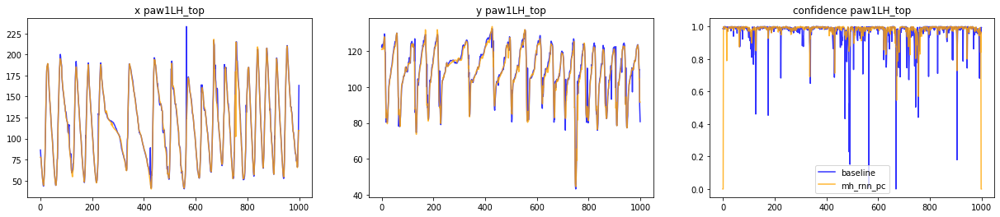

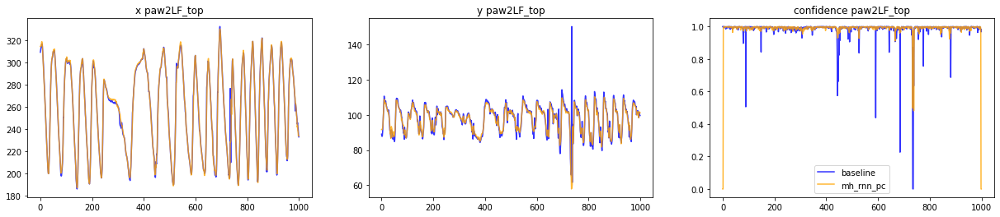

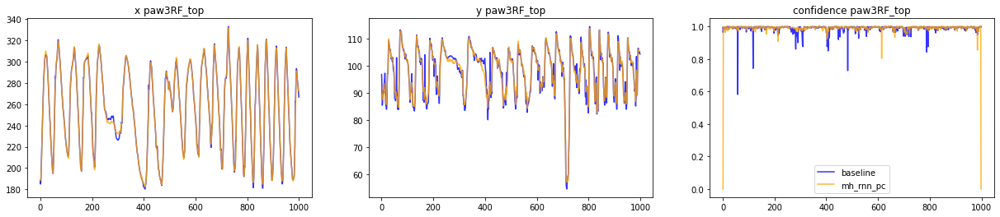

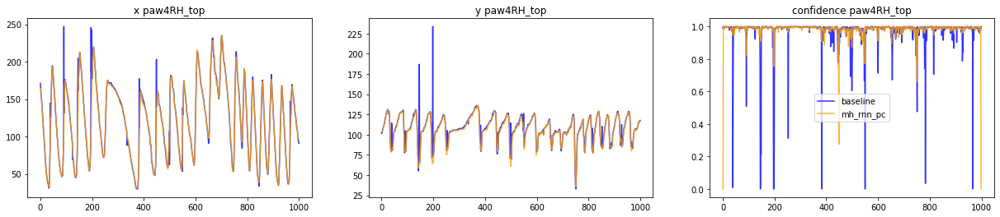

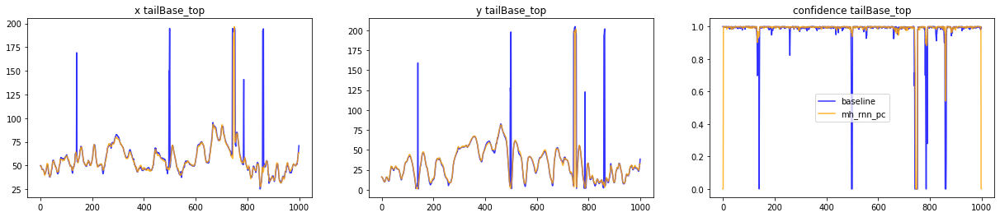

...

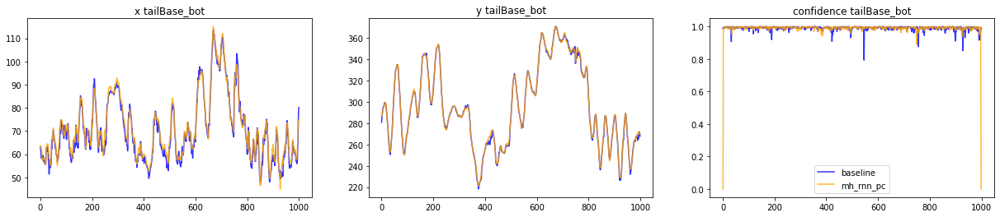

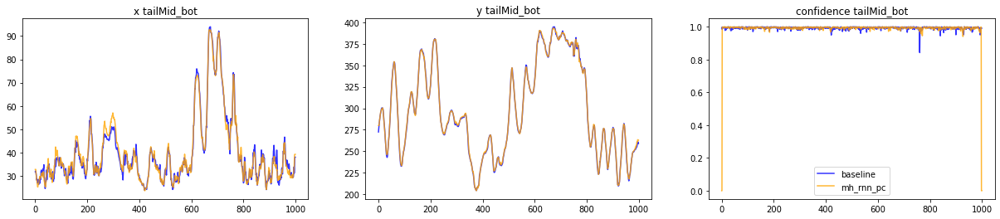

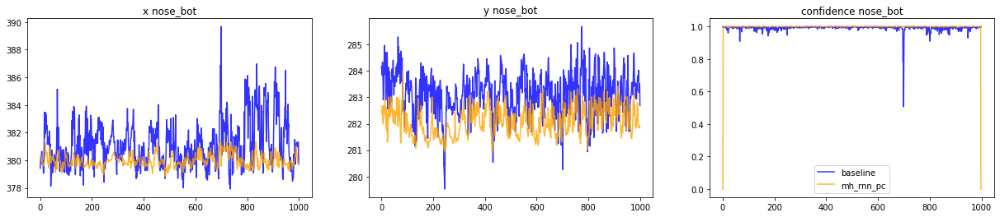

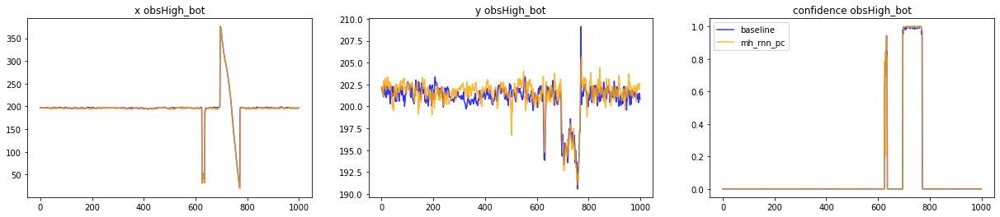

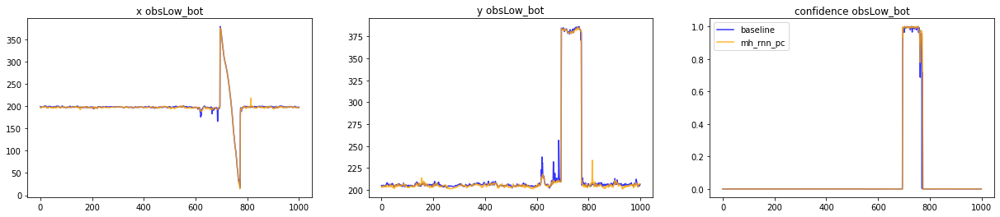

In [5]:
alpha=.8
for i, marker_name in enumerate(marker_names):
    fig, axes = plt.subplots(1,3, figsize=(21,4))
    axes[0].plot(x_list[0].T[i], color="blue", label=model_names[0], alpha=alpha)
    axes[0].set_title("x " + marker_name)
    axes[1].plot(y_list[0].T[i], color="blue", label=model_names[0], alpha=alpha)
    axes[1].set_title("y " + marker_name)
    axes[2].plot(confidence_list[0].T[i], color="blue", label=model_names[0], alpha=alpha)
    axes[2].set_title("confidence " + marker_name)
    axes[0].plot(x_list[1].T[i], color="orange", label=model_names[1], alpha=alpha)
    axes[1].plot(y_list[1].T[i], color="orange", label=model_names[1], alpha=alpha)
    axes[2].plot(confidence_list[1].T[i], color="orange", label=model_names[1], alpha=alpha)
    plt.legend()
    plt.show()

## postprocessing

In [6]:
from diagnostics.postprocessing import postprocess_traces

In [7]:
#postprocess baseline
kwargs = {"confidence_threshold":.95, "confidence_thresholds":[.8, .85, .9, .95]}
model_id = 0
coordinates_post, confidence_post = postprocess_traces(csvs[model_id], method='confidence', excluded_keypoints=[marker_names[7], marker_names[15], marker_names[16]], verbose=False, **kwargs)
coordinates_post_ensemble, confidence_post_ensemble = postprocess_traces(csvs[model_id], method='confidence_ensemble', excluded_keypoints=[marker_names[7], marker_names[15], marker_names[16]], verbose=False, **kwargs)

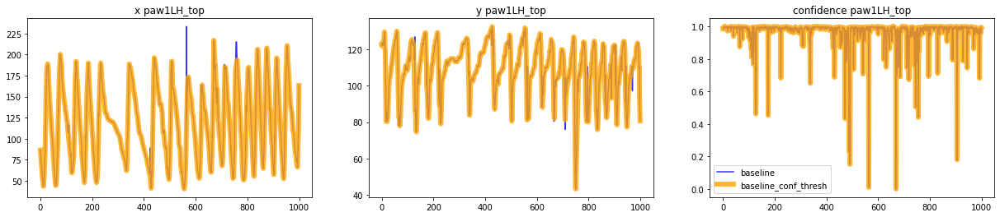

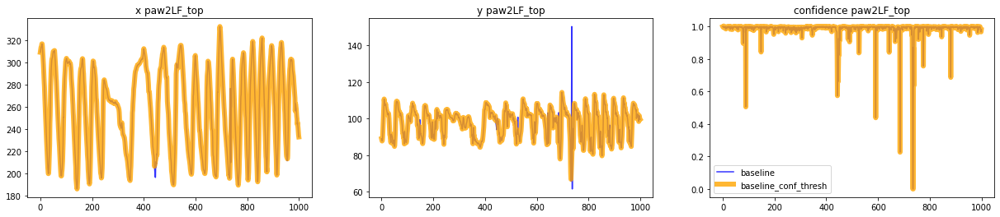

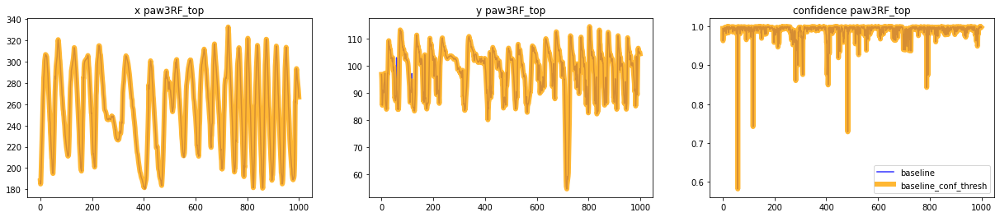

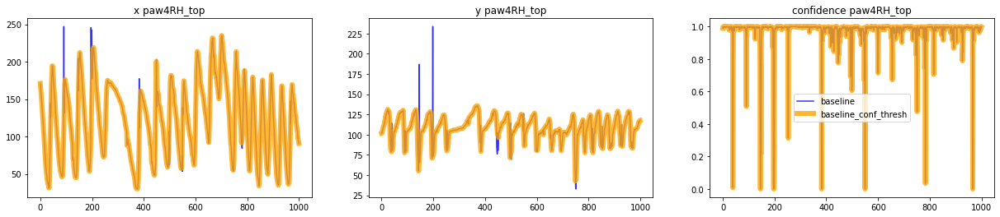

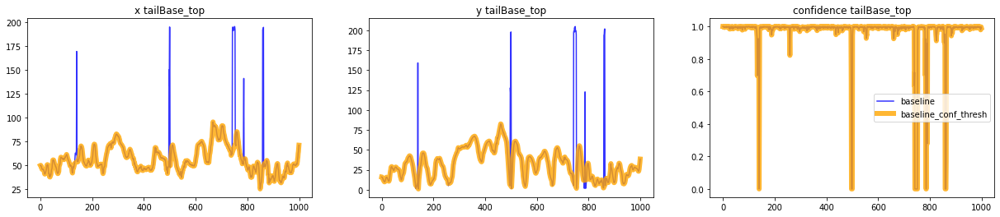

...

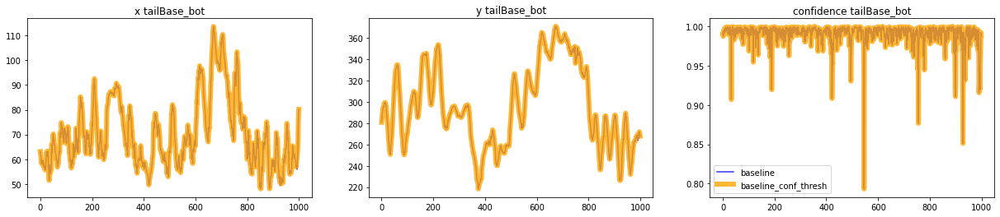

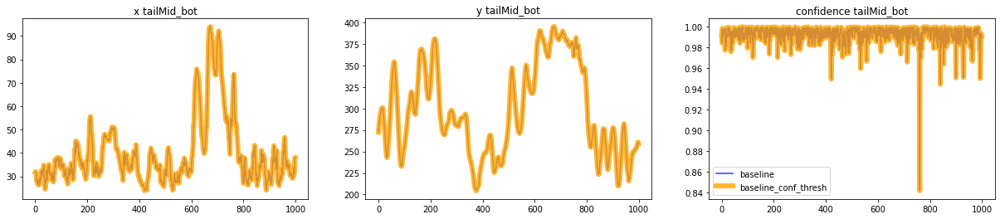

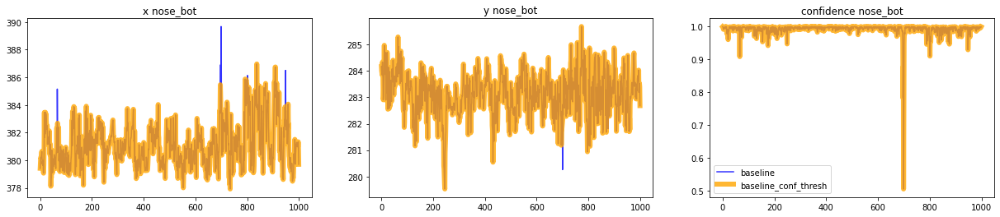

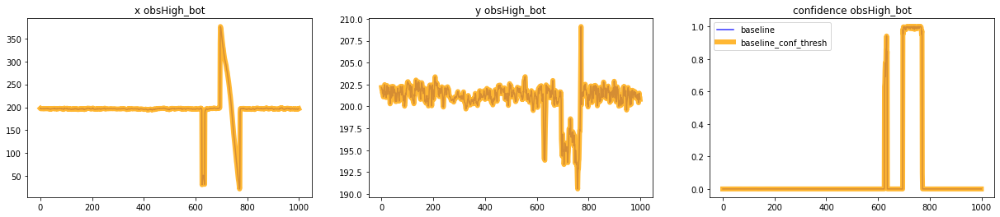

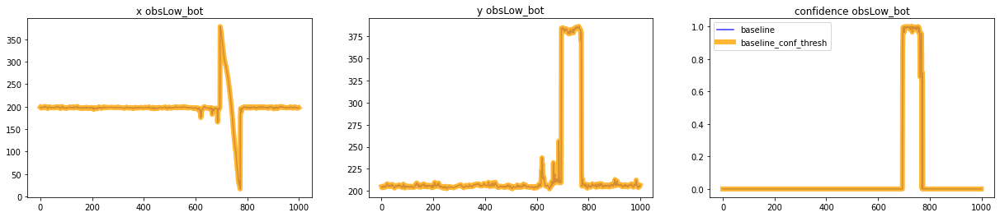

In [13]:
#baseline vs baseline_conf_threshold
alpha=.8
for i, marker_name in enumerate(marker_names):
    fig, axes = plt.subplots(1,3, figsize=(21,4))
    axes[0].plot(x_list[model_id].T[i], color="blue", label=model_names[model_id], alpha=alpha)
    axes[0].set_title("x " + marker_name)
    axes[1].plot(y_list[model_id].T[i], color="blue", label=model_names[model_id], alpha=alpha)
    axes[1].set_title("y " + marker_name)
    axes[2].plot(confidence_list[model_id].T[i], color="blue", label=model_names[model_id], alpha=alpha)
    axes[2].set_title("confidence " + marker_name)
    axes[0].plot(coordinates_post[:,:,0].T[i], color="orange", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    axes[1].plot(coordinates_post[:,:,1].T[i], color="orange", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    axes[2].plot(confidence_post.T[i], color="orange", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    plt.legend()
    plt.show()

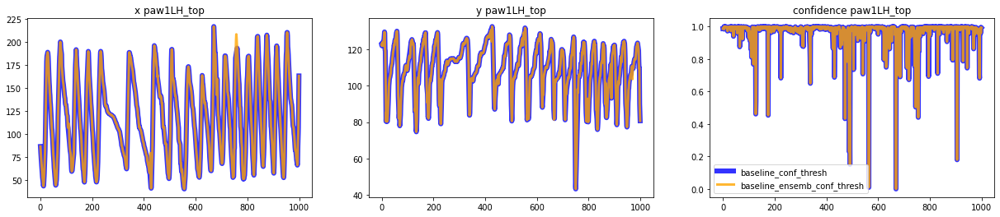

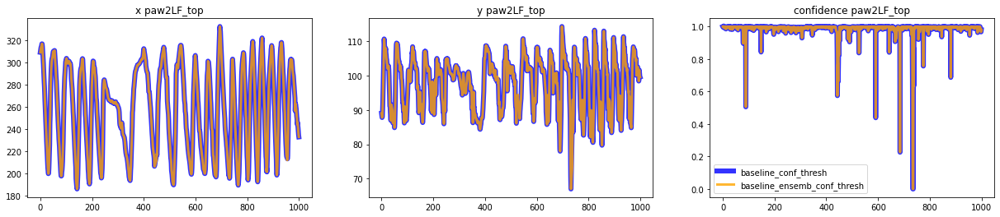

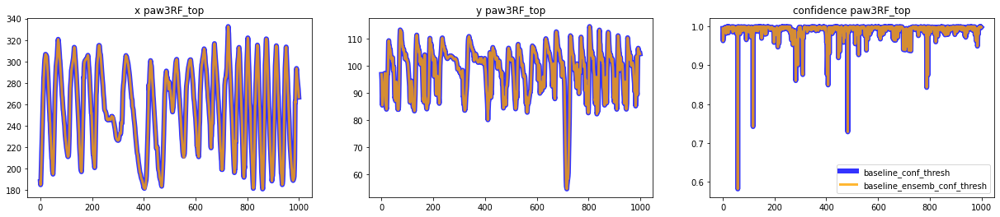

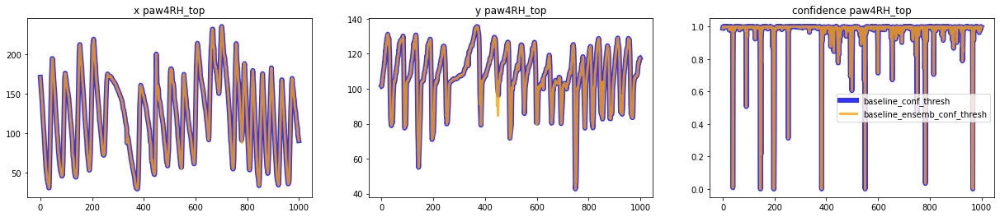

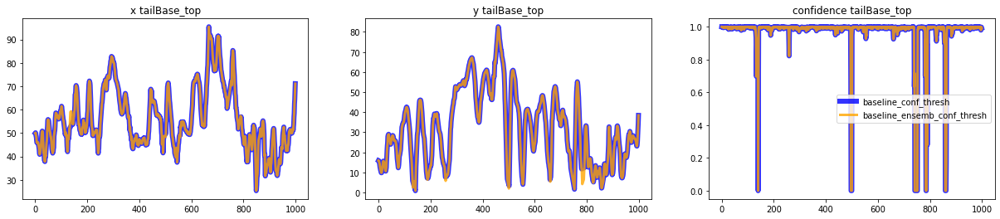

...

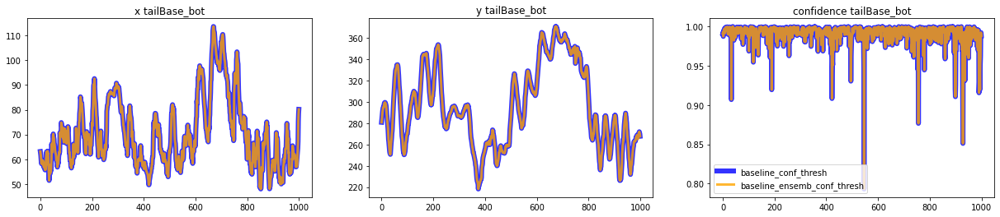

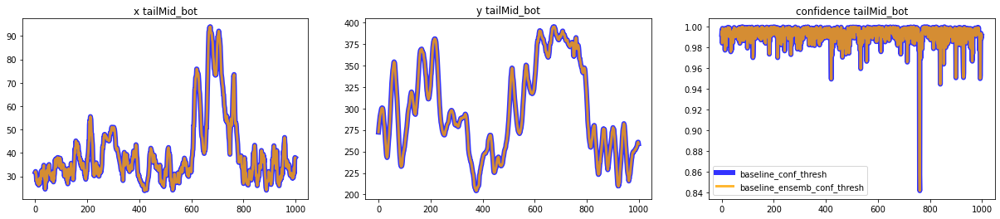

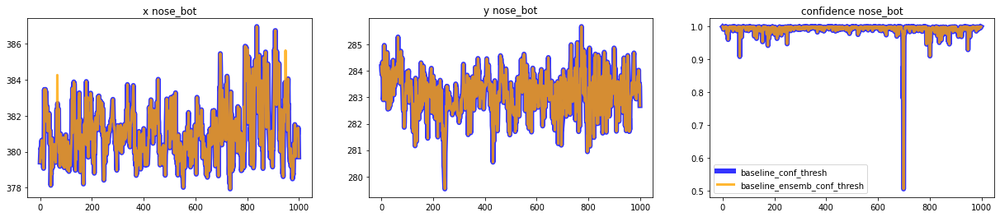

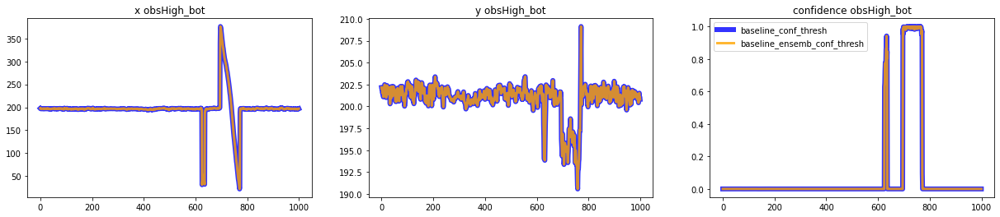

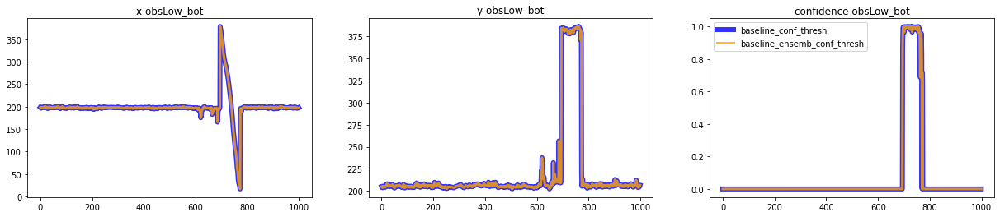

In [14]:
#baseline_conf_threshold vs baseline_ensemble_conf_threshold
alpha=.8
for i, marker_name in enumerate(marker_names):
    fig, axes = plt.subplots(1,3, figsize=(21,4))
    axes[0].plot(coordinates_post[:,:,0].T[i], color="blue", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    axes[0].set_title("x " + marker_name)
    axes[1].plot(coordinates_post[:,:,1].T[i], color="blue", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    axes[1].set_title("y " + marker_name)
    axes[2].plot(confidence_post.T[i], color="blue", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    axes[2].set_title("confidence " + marker_name)
    axes[0].plot(coordinates_post_ensemble[:,:,0].T[i], color="orange", label=model_names[model_id]+"_ensemb_conf_thresh", alpha=alpha,lw=3)
    axes[1].plot(coordinates_post_ensemble[:,:,1].T[i], color="orange", label=model_names[model_id]+"_ensemb_conf_thresh", alpha=alpha,lw=3)
    axes[2].plot(confidence_post_ensemble.T[i], color="orange", label=model_names[model_id]+"_ensemb_conf_thresh", alpha=alpha,lw=3)
    plt.legend()
    plt.show()

In [15]:
#postprocess mh_rnn_pc
kwargs = {"confidence_threshold":.95, "confidence_thresholds":[.8, .85, .9, .95]}
model_id = 1
coordinates_post, confidence_post = postprocess_traces(csvs[model_id], method='confidence', excluded_keypoints=[marker_names[7], marker_names[15], marker_names[16]], verbose=False, **kwargs)
coordinates_post_ensemble, confidence_post_ensemble = postprocess_traces(csvs[model_id], method='confidence_ensemble', excluded_keypoints=[marker_names[7], marker_names[15], marker_names[16]], verbose=False, **kwargs)

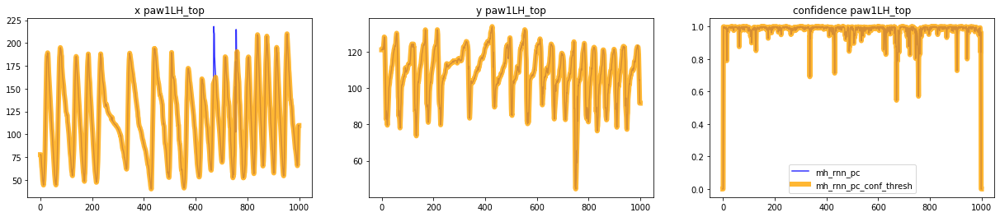

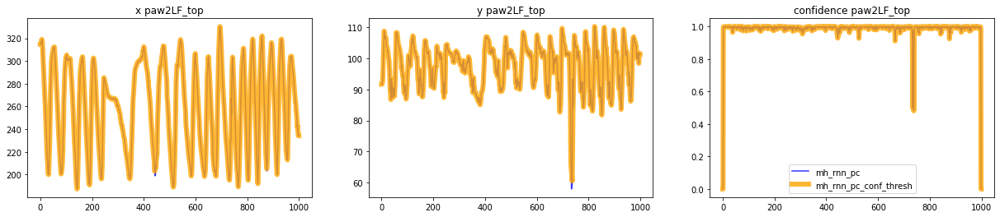

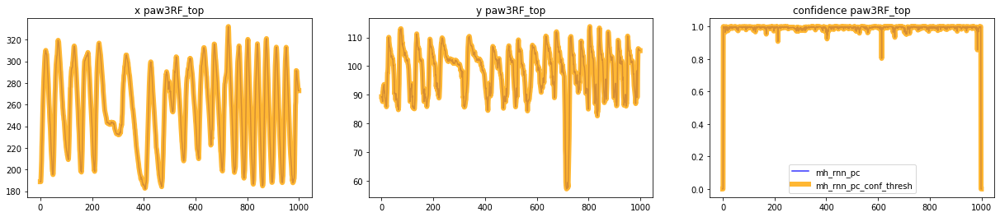

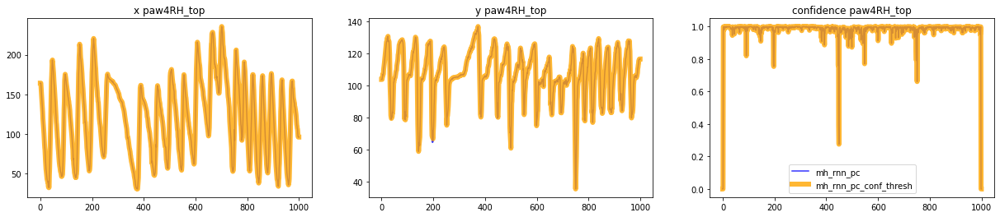

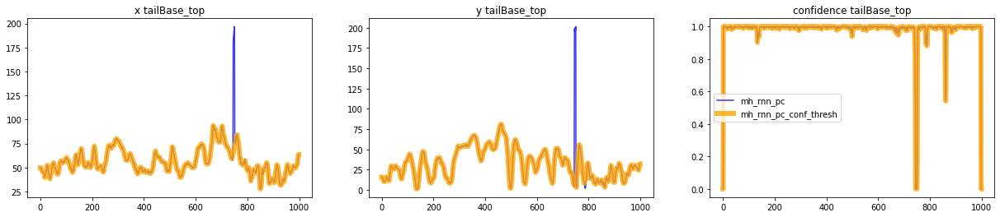

...

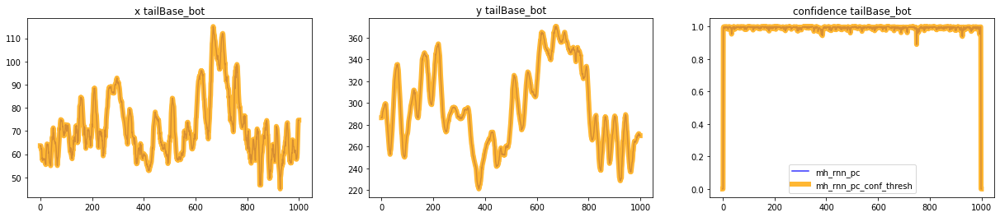

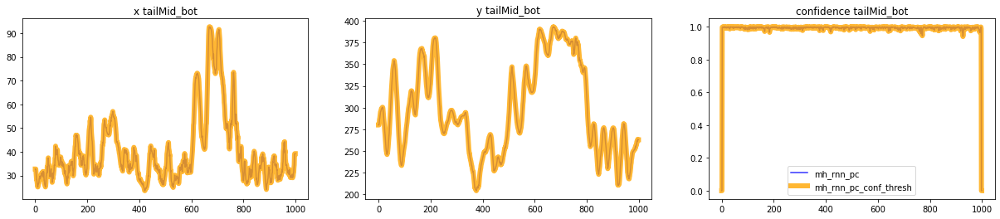

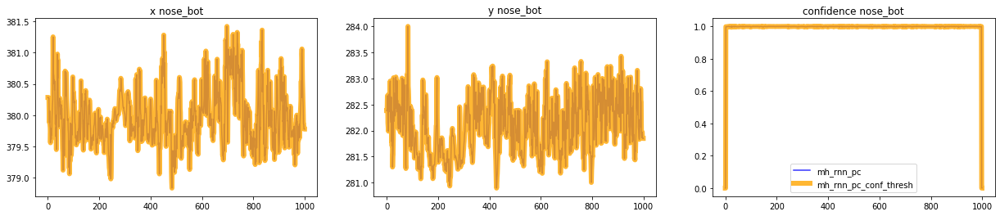

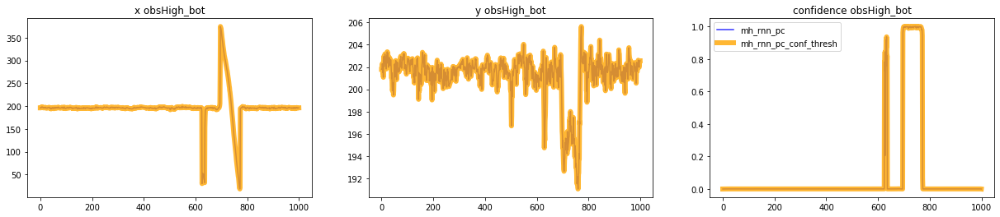

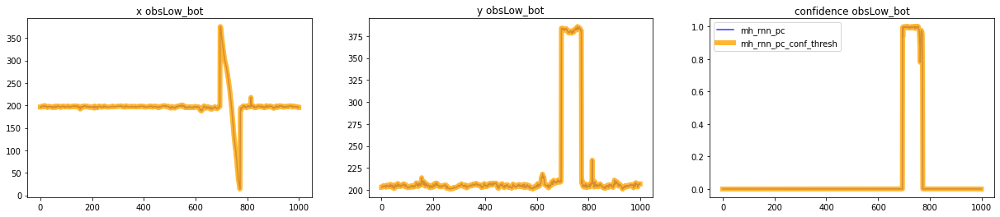

In [17]:
#mh_rnn_pc vs mh_rnn_pc_conf_threshold
alpha=.8
for i, marker_name in enumerate(marker_names):
    fig, axes = plt.subplots(1,3, figsize=(21,4))
    axes[0].plot(x_list[model_id].T[i], color="blue", label=model_names[model_id], alpha=alpha)
    axes[0].set_title("x " + marker_name)
    axes[1].plot(y_list[model_id].T[i], color="blue", label=model_names[model_id], alpha=alpha)
    axes[1].set_title("y " + marker_name)
    axes[2].plot(confidence_list[model_id].T[i], color="blue", label=model_names[model_id], alpha=alpha)
    axes[2].set_title("confidence " + marker_name)
    axes[0].plot(coordinates_post[:,:,0].T[i], color="orange", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    axes[1].plot(coordinates_post[:,:,1].T[i], color="orange", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    axes[2].plot(confidence_post.T[i], color="orange", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    plt.legend()
    plt.show()

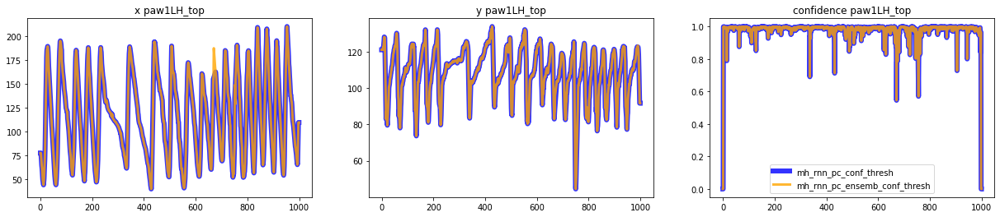

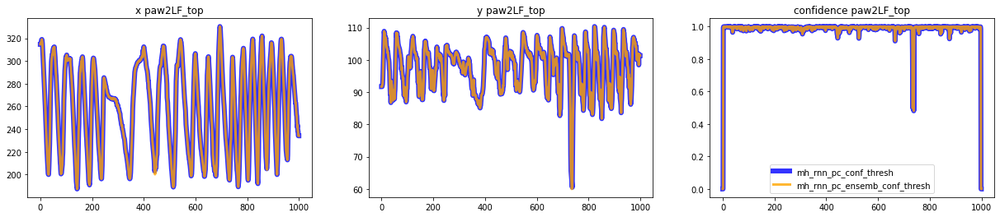

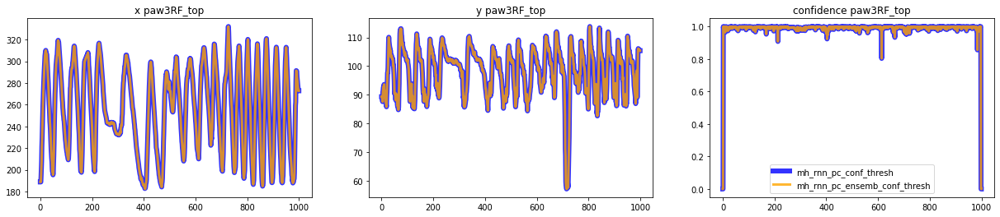

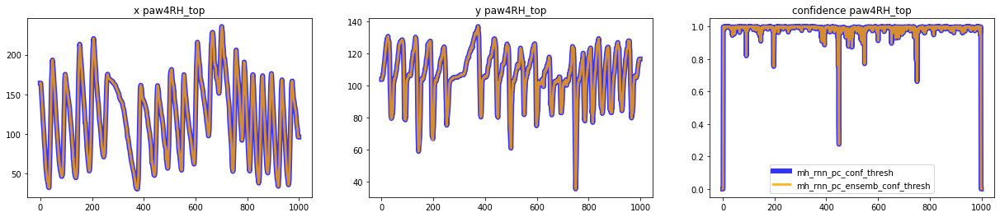

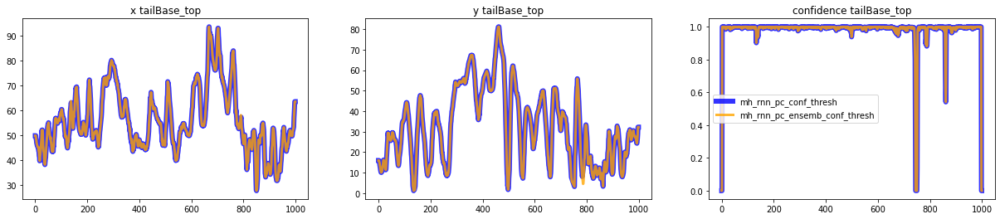

...

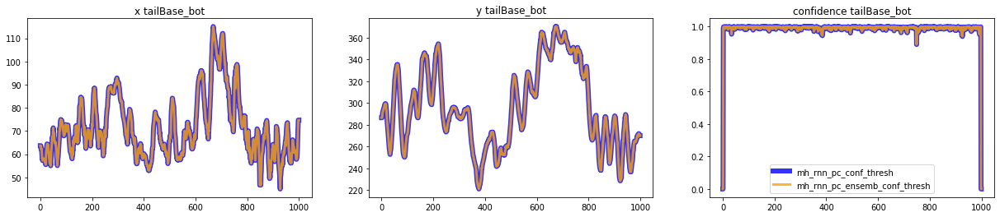

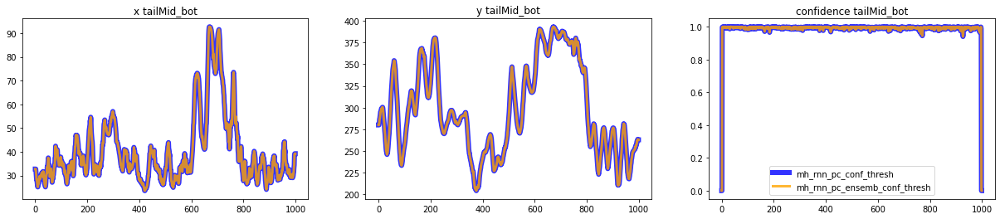

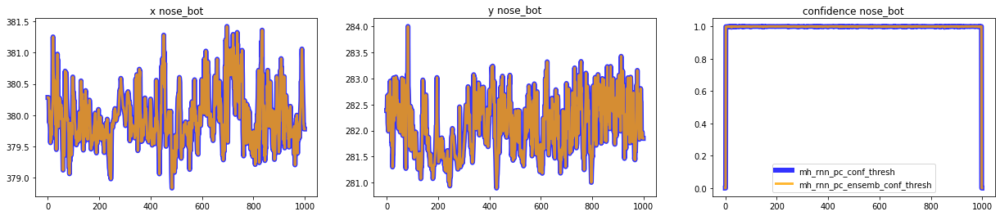

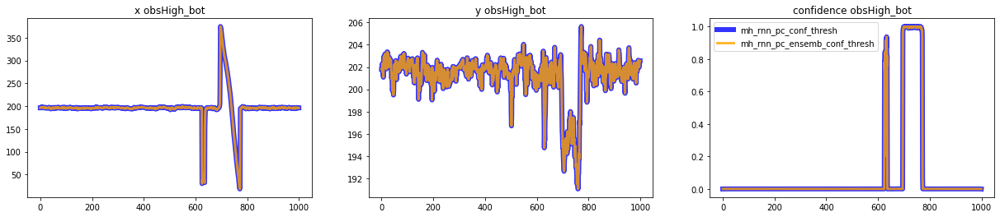

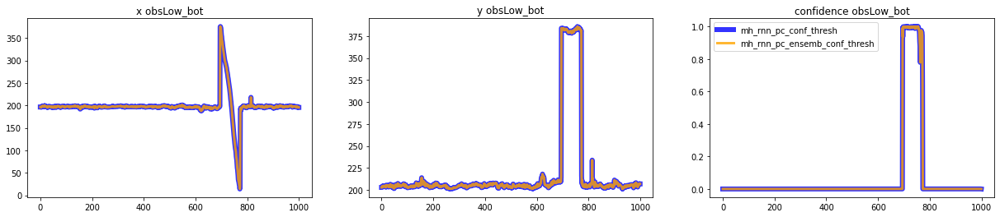

In [18]:
#mh_rnn_pc_conf_threshold vs mh_rnn_pc_ensemble_conf_threshold
alpha=.8
for i, marker_name in enumerate(marker_names):
    fig, axes = plt.subplots(1,3, figsize=(21,4))
    axes[0].plot(coordinates_post[:,:,0].T[i], color="blue", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    axes[0].set_title("x " + marker_name)
    axes[1].plot(coordinates_post[:,:,1].T[i], color="blue", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    axes[1].set_title("y " + marker_name)
    axes[2].plot(confidence_post.T[i], color="blue", label=model_names[model_id]+"_conf_thresh", alpha=alpha,lw=6)
    axes[2].set_title("confidence " + marker_name)
    axes[0].plot(coordinates_post_ensemble[:,:,0].T[i], color="orange", label=model_names[model_id]+"_ensemb_conf_thresh", alpha=alpha,lw=3)
    axes[1].plot(coordinates_post_ensemble[:,:,1].T[i], color="orange", label=model_names[model_id]+"_ensemb_conf_thresh", alpha=alpha,lw=3)
    axes[2].plot(confidence_post_ensemble.T[i], color="orange", label=model_names[model_id]+"_ensemb_conf_thresh", alpha=alpha,lw=3)
    plt.legend()
    plt.show()

## make videos

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-paw1LH_top_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-paw2LF_top_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-paw3RF_top_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-paw4RH_top_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-tailBase_top_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-tailMid_top_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-nose_top_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-paw1LH_bot_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-paw2LF_bot_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-paw3RF_bot_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-paw4RH_bot_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-tailBase_bot_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-tailMid_bot_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/videos/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-nose_bot_baseline_vs_mh_rnn_pc.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

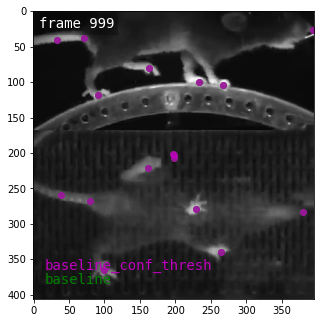

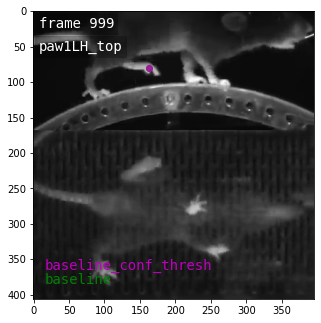

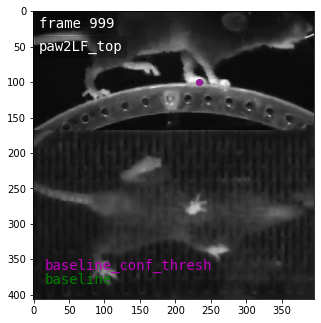

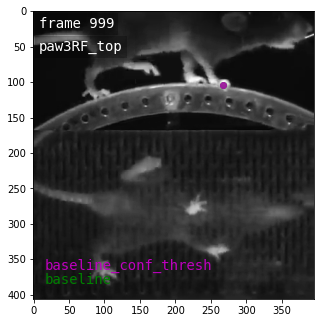

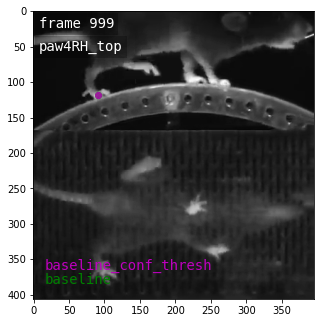

...

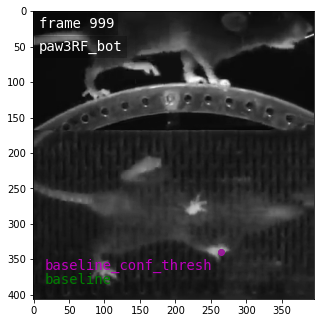

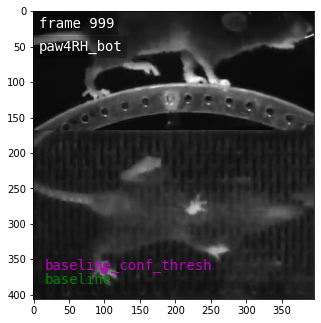

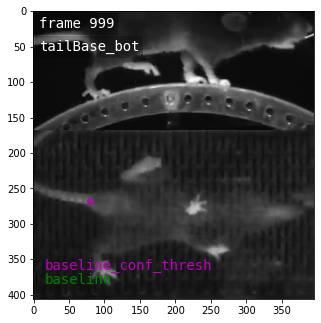

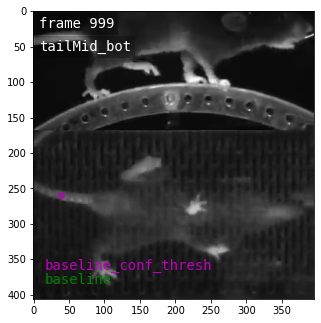

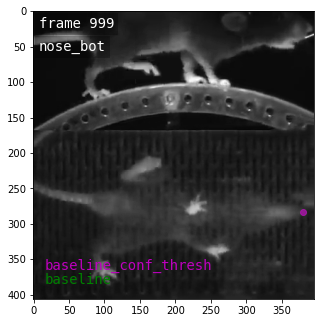

In [21]:
from diagnostics.video import make_labeled_video_wrapper

video_name = "180609_002.short.mp4"
video = "/Users/colehurwitz/pose-estimation/data/mirror-mouse/videos_test/%s" % video_name
assert(os.path.exists(video))

keypoints = [None] + marker_names

#postprocess baseline
kwargs = {"confidence_threshold":.95, "confidence_thresholds":[.8, .85, .9, .95]}
model_id = 0
coordinates_post, confidence_post = postprocess_traces(csvs[model_id], method='confidence', excluded_keypoints=[marker_names[7], marker_names[15], marker_names[16]], verbose=False, **kwargs)
x_list_post = [x_list[model_id], coordinates_post[:,:,0]]
y_list_post = [y_list[model_id], coordinates_post[:,:,1]]
confidence_list_post = [confidence_list[model_id], confidence_post]

model_names_video = [model_names[model_id], model_names[model_id]+"_conf_thresh"]

for keypoint in keypoints:
    if keypoint is None or keypoint not in [marker_names[7], marker_names[15], marker_names[16]]: 
        marker_name_plot = keypoint 
        # save labeled video in same dir as original video with this appended to filename
        if marker_name_plot is not None:
            combo_name = f"/Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-{marker_name_plot}_{model_1}_vs_{model_2}.mp4"
        else:
            combo_name = f"/Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-{model_1}_vs_{model_2}.mp4"
        make_labeled_video_wrapper(
            csvs=[csvs[model_id], csvs[model_id]], model_names=model_names_video, video=video, save_file=combo_name,
            likelihood_thresh=0.00, max_frames=1000, markersize=6, framerate=20, height=4, marker_name_plot=marker_name_plot, annotate=False,
            x_list = x_list_post, y_list = y_list_post, confidence_list = confidence_list_post, marker_names_list=[marker_names, marker_names],
        )

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-paw1LH_top_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-paw2LF_top_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-paw3RF_top_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-paw4RH_top_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-tailBase_top_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-tailMid_top_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-nose_top_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-paw1LH_bot_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-paw2LF_bot_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-paw3RF_bot_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-paw4RH_bot_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-tailBase_bot_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-tailMid_bot_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

processing frame 000/1000
processing frame 100/1000
processing frame 200/1000
processing frame 300/1000
processing frame 400/1000
processing frame 500/1000
processing frame 600/1000
processing frame 700/1000
processing frame 800/1000
processing frame 900/1000
ffmpeg -r 20.000000 -i /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/tmpZzZ/frame_%06d.jpeg -c:v libx264 /Users/colehurwitz/tracking-diagnostics/notebooks/ensemble_postprocess_mirror-mouse_baseline_vs_mh_rnn_pc/video-nose_bot_baseline_vs_mh_rnn_pc-ensemble_post.mp4


ffmpeg version 5.0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with Apple clang version 13.1.6 (clang-1316.0.21.2.5)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/5.0.1_3 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libbluray --enable-libdav1d --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disable-libjack --disable-indev=jack --enable-videotoo

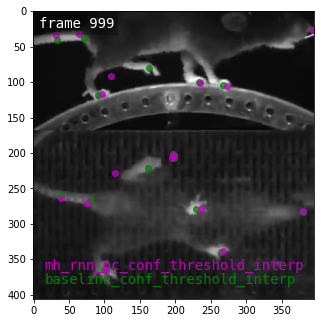

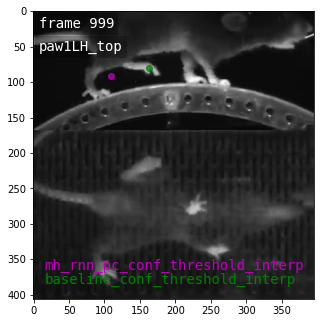

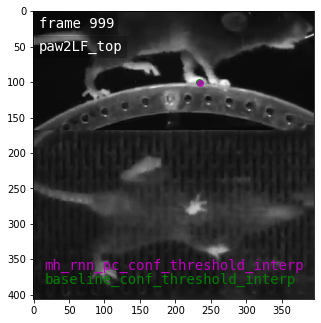

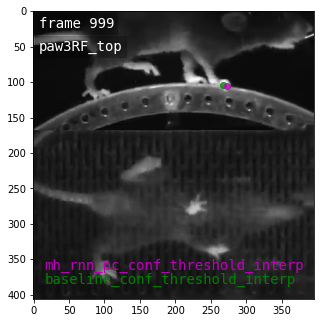

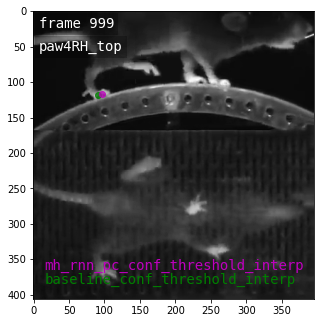

...

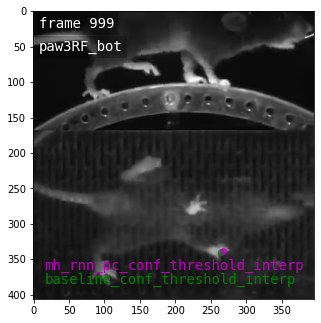

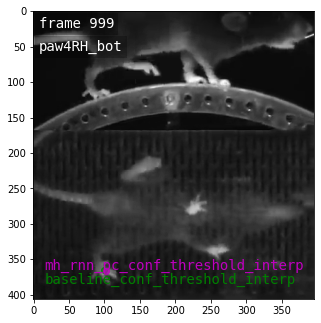

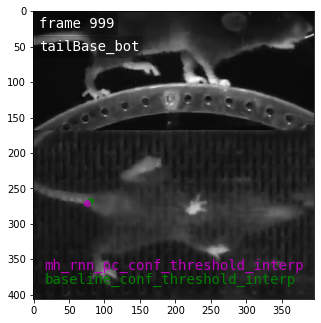

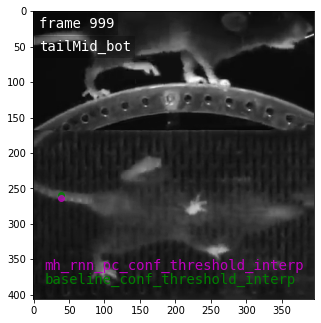

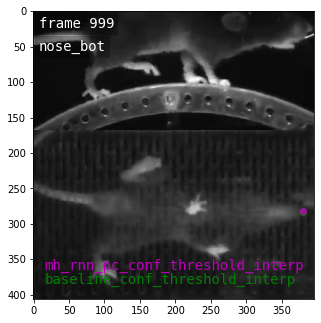

In [30]:
from diagnostics.video import make_labeled_video_wrapper

video_name = "180609_002.short.mp4"
video = "/Users/colehurwitz/pose-estimation/data/mirror-mouse/videos_test/%s" % video_name
assert(os.path.exists(video))

keypoints = [None] + marker_names

#postprocess baseline
kwargs = {"confidence_threshold":.95, "confidence_thresholds":[.8, .85, .9, .95]}
model_id = 1
coordinates_post, confidence_post = postprocess_traces(csvs[model_id], method='confidence', excluded_keypoints=[marker_names[7], marker_names[15], marker_names[16]], verbose=False, **kwargs)
x_list_post = [x_list[model_id], coordinates_post[:,:,0]]
y_list_post = [y_list[model_id], coordinates_post[:,:,1]]
confidence_list_post = [confidence_list[model_id], confidence_post]

model_names_video = [model_names[model_id], model_names[model_id]+"_conf_thresh"]

for keypoint in keypoints:
    if keypoint is None or keypoint not in [marker_names[7], marker_names[15], marker_names[16]]: 
        marker_name_plot = keypoint 
        # save labeled video in same dir as original video with this appended to filename
        if marker_name_plot is not None:
            combo_name = f"/Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-{marker_name_plot}_{model_1}_vs_{model_2}.mp4"
        else:
            combo_name = f"/Users/colehurwitz/tracking-diagnostics/notebooks/videos/video-{model_1}_vs_{model_2}.mp4"
        make_labeled_video_wrapper(
            csvs=[csvs[model_id], csvs[model_id]], model_names=model_names_video, video=video, save_file=combo_name,
            likelihood_thresh=0.00, max_frames=1000, markersize=6, framerate=20, height=4, marker_name_plot=marker_name_plot, annotate=False,
            x_list = x_list_post, y_list = y_list_post, confidence_list = confidence_list_post, marker_names_list=[marker_names, marker_names],
        )